<a href="https://colab.research.google.com/github/DrYGuo/Defect-detection-in-atomic-resolution-image-via-unsupervised-learning-with-translational-invariance/blob/main/Detect_partial_dislocations_in_Al_with_a_simulated_STEM_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Read tif and display the image

In [ ]:
path='/content/drive/Shareddrives/TMD_NIST/relaxed_single_Al partial_dislocations.tif'

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

import scipy


In [ ]:
plt.set_cmap('gray')

<Figure size 432x288 with 0 Axes>

(-0.5, 1023.5, 1023.5, -0.5)

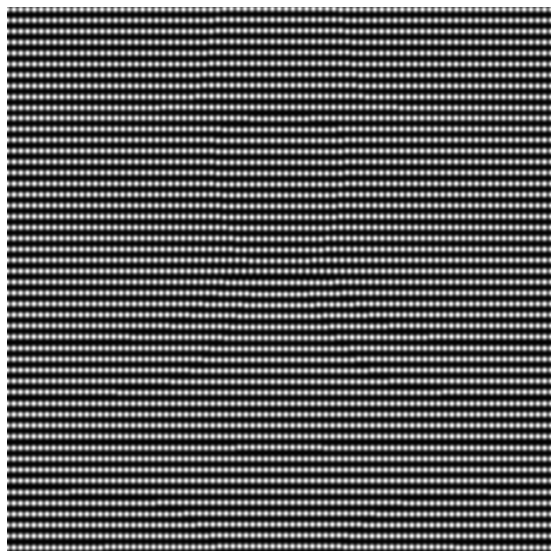

In [ ]:
image = Image.open(path)
ZrO2=np.array(image)[100:1124]
plt.figure(figsize=(10,10))
plt.imshow(ZrO2,cmap='gray')
plt.axis('off')
# plt.colorbar()

In [ ]:
ZrO2.shape

(1024, 1024)


# Starting from here



Now, I come up with the following idea:

**Multi-channel IFFT**

1. Identify all the atom positions
2. Find the shortest k_vectors from the FFT, say 3 basis k_vectors, k1, k2, k3
Thus, we also know the corresponding spacings in real space d1, d2, d3
3. Take the IFFT for each k_vector
4. At each atom position, crop the IFFT images IFFT1, IFFT2 and IFFT3 with three squared boxes with d1, d2, and d3
5. Take the Patterson function of each cropped image and form P1, P2 and P3
6. Then, we have a 3-channel tensor for each atom, since each channel has a different dimension we fill the empty elements with zeros.
7. Then, we are ready to do classfications. We may expect that this classfication could give different domains with different unit cells and twin boundaries. Thus, we can classify different phases. Each phase correspond to 2 of the 3 channels. And we can also detect defects within each phase.

For step 6, we can alternatively do a rotation for each IFFT and scale it to the same size.

## 1. Identify all the atom positions

In [ ]:
im=ZrO2

In [ ]:
margin_size=45
from skimage.feature import peak_local_max
atomXY_temp=peak_local_max(im, min_distance=5,threshold_abs=2e4)

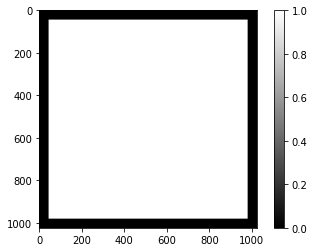

In [ ]:
mask=np.ones((im.shape[0],im.shape[1]))

for i in range(1024):
  for j in range(1024):
    if i<margin_size or i>1024-margin_size or j<margin_size or j>1024-margin_size:
      mask[i,j]=0

plt.imshow(mask)
plt.colorbar()

In [ ]:
from skimage.feature import peak_local_max
atomXY=peak_local_max(im*mask, min_distance=5,threshold_abs=im.max()/4)


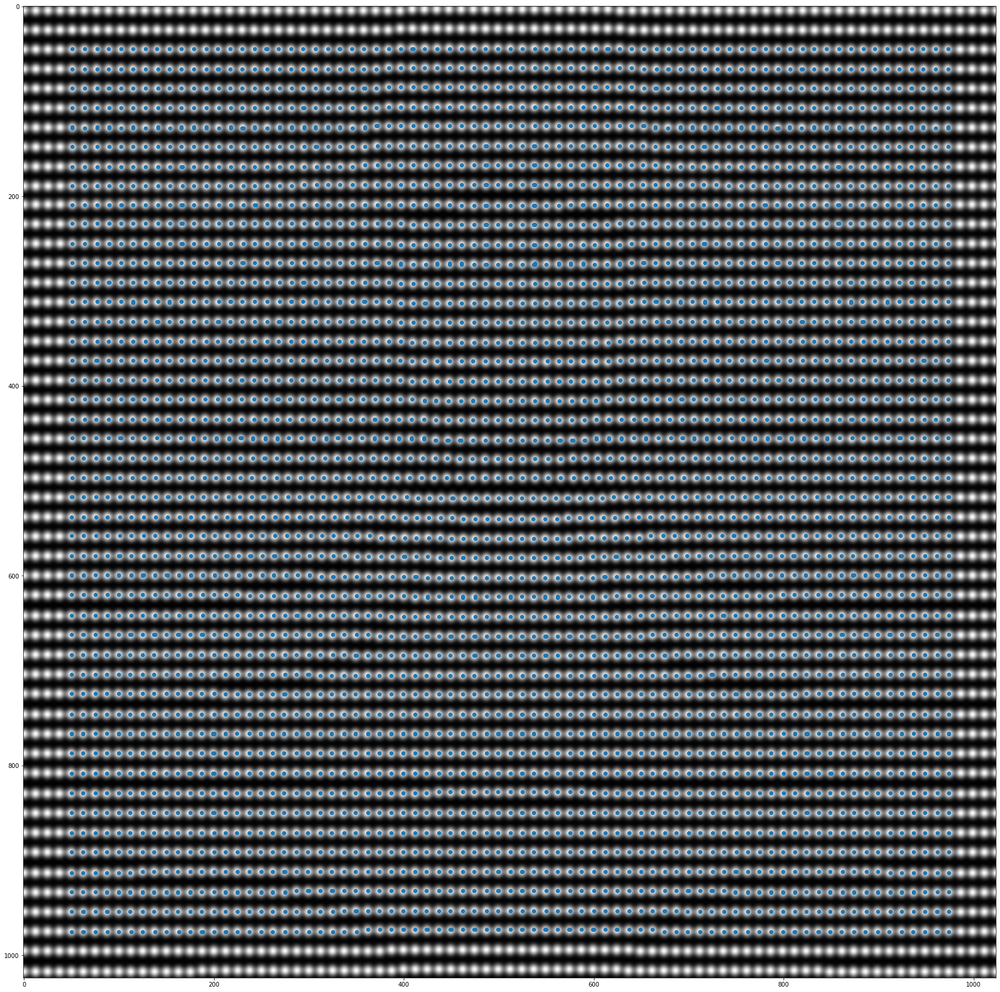

In [ ]:
# atomXY=peak_local_max(im, min_distance=5,threshold_abs=im.max()/4)
plt.figure(figsize=(30,30))
plt.imshow(im)
# plt.colorbar()
plt.scatter(atomXY[:,1],atomXY[:,0])

## 2.Find the shortest k_vectors from the FFT, say 3 basis k_vectors, k1, k2, k3 Thus, we also know the corresponding spacings in real space d1, d2, d3

(-0.5, 1023.5, 1023.5, -0.5)

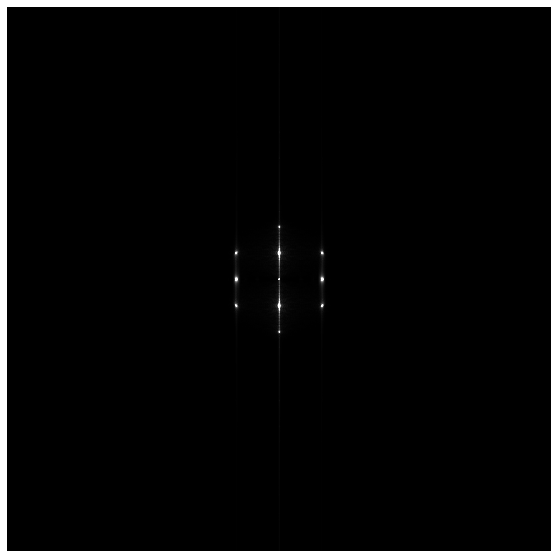

In [ ]:
FFT=scipy.fft.fft2(ZrO2)
FFT_shift=scipy.fft.fftshift(FFT)
plt.figure(figsize=(10,10))
plt.imshow(abs(FFT_shift),vmax=1e6)
# plt.colorbar()
plt.axis('off')

In [ ]:
abs(FFT_shift).max()

88897051.0

(11, 2)


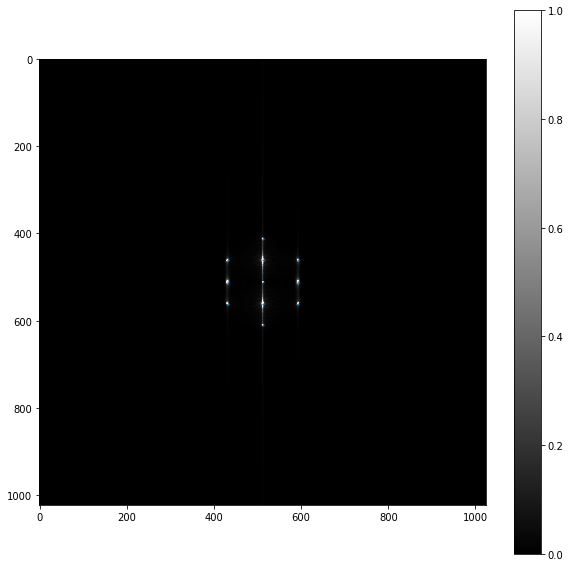

In [ ]:
from skimage.feature import peak_local_max
FFT_peaks= peak_local_max(abs(FFT_shift), min_distance=5,threshold_abs=1e6)
plt.figure(figsize=(10,10))
plt.imshow(abs(FFT_shift),vmax=1e6)
plt.scatter(FFT_peaks[:,1],FFT_peaks[:,0],s=1)
plt.colorbar()
print(FFT_peaks.shape)

In [ ]:
FFT_X=FFT.shape[0]
FFT_Y=FFT.shape[1]
print(FFT_X,FFT_Y)

#creat a new FFT_shift so that the new one has excluded the spurious peaks at high frequencies
FFT_shift_new=np.zeros((FFT_X,FFT_Y),dtype=complex)
FFT_shift_new[int(FFT_X/4):int(3*FFT_X/4),int(FFT_Y/4):int(3*FFT_Y/4)]=FFT_shift[int(FFT_X/4):int(3*FFT_X/4),int(FFT_Y/4):int(3*FFT_Y/4)]


1024 1024


In [ ]:
import math
k_distance=np.zeros((FFT_peaks.shape[0]))
k_peaks=np.zeros((FFT_peaks.shape[0],3))
print(k_peaks.shape)
for i, (x,y) in enumerate(FFT_peaks):
  k_distance[i]=math.sqrt((x-FFT_X/2)**2+(y-FFT_Y/2)**2)
  k_peaks[i,:]=(x,y,k_distance[i])
  # print(x,y,k_distance[i])
# print(k_distance)
print(k_peaks)
print('sorted')
sorted_k_peaks=k_peaks[k_peaks[:,2].argsort()] # sort k_peaks by the second column, k_distance
print(sorted_k_peaks)
print('k_peaks: row, col,length')
print(k_peaks)

(11, 3)
[[611.         512.          99.        ]
 [562.         592.          94.33981132]
 [562.         512.          50.        ]
 [562.         432.          94.33981132]
 [512.         592.          80.        ]
 [512.         512.           0.        ]
 [512.         432.          80.        ]
 [462.         592.          94.33981132]
 [462.         512.          50.        ]
 [462.         432.          94.33981132]
 [413.         512.          99.        ]]
sorted
[[512.         512.           0.        ]
 [562.         512.          50.        ]
 [462.         512.          50.        ]
 [512.         592.          80.        ]
 [512.         432.          80.        ]
 [562.         592.          94.33981132]
 [562.         432.          94.33981132]
 [462.         592.          94.33981132]
 [462.         432.          94.33981132]
 [611.         512.          99.        ]
 [413.         512.          99.        ]]
k_peaks: row, col,length
[[611.         512.          99.  

In [ ]:
k_vectors=np.zeros((6,2))

for i in range(6):
   k_vectors[i,0]=sorted_k_peaks[i+1,0]-FFT_X/2
   k_vectors[i,1]=sorted_k_peaks[i+1,1]-FFT_Y/2

print(k_vectors)

[[ 50.   0.]
 [-50.   0.]
 [  0.  80.]
 [  0. -80.]
 [ 50.  80.]
 [ 50. -80.]]


In [ ]:
window=np.zeros((55,55))
shift_center=math.floor(window.shape[0]/2)
cos_alpha_list=np.zeros((k_vectors.shape[0]))
sin_alpha_list=np.zeros((k_vectors.shape[0]))

for i in range(k_vectors.shape[0]):
  cos_alpha_list[i]=k_vectors[i,0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
  sin_alpha_list[i]=k_vectors[i,1]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
print(cos_alpha_list)

[ 1.         -1.          0.          0.          0.52999894  0.52999894]


In [ ]:
r_vectors=np.zeros((6,2))
for i in range(6):
   d_spacing=ZrO2.shape[0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
   r_vectors[i,0]=-(d_spacing/2)/cos_alpha_list[i]
   r_vectors[i,1]=(d_spacing/2)/sin_alpha_list[i]
print('tranlation by')
print(r_vectors)


tranlation by
[[-10.24    inf]
 [ 10.24    inf]
 [  -inf   6.4 ]
 [  -inf  -6.4 ]
 [-10.24   6.4 ]
 [-10.24  -6.4 ]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.


## 3.Take the IFFT for each k_vector

In [ ]:
FFT.shape

(1024, 1024)

In [ ]:
def FFT_mask(k_vector_i,r_mask):
   k_x=k_vector_i[0]
   k_y=k_vector_i[1]
   FFT_mask=np.zeros((FFT.shape[0],FFT.shape[1]))
   for i in range(-r_mask,r_mask):
     for j in range(-r_mask,r_mask):
        if i**2+j**2<=r_mask**2:
          #  print(k_x,k_y)
           FFT_mask[int(FFT.shape[0]/2+k_x+i),int(FFT.shape[1]/2+k_y+j)]=1
           FFT_mask[int(FFT.shape[0]/2-k_x+i),int(FFT.shape[1]/2-k_y+j)]=1
   
   return FFT_mask

[ 0. 80.]


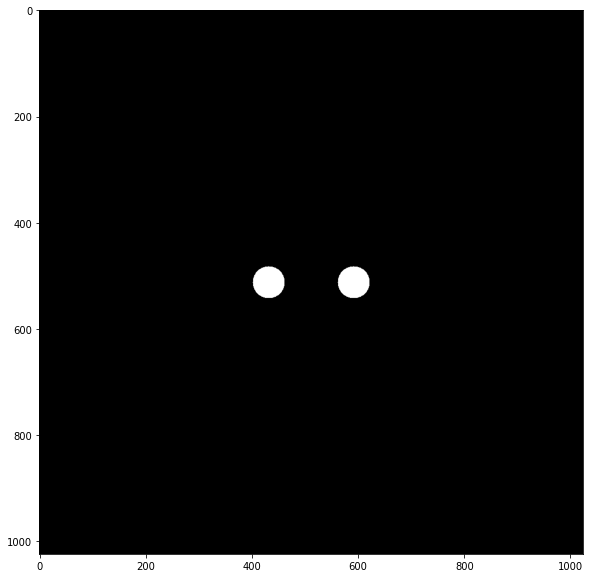

In [ ]:
r_mask=30
k_vector_i=k_vectors[2,:]
print(k_vector_i)
plt.figure(figsize=(10,10))
plt.imshow(FFT_mask(k_vectors[2,:],r_mask))


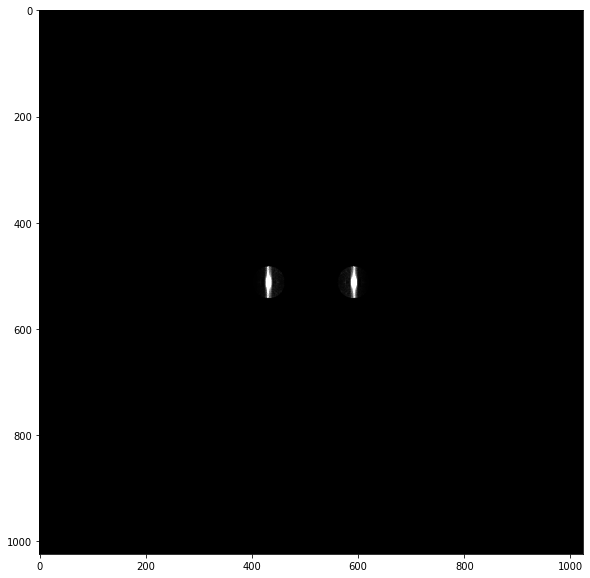

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(abs(FFT_shift*FFT_mask(k_vectors[2,:],r_mask)),vmax=1e5)

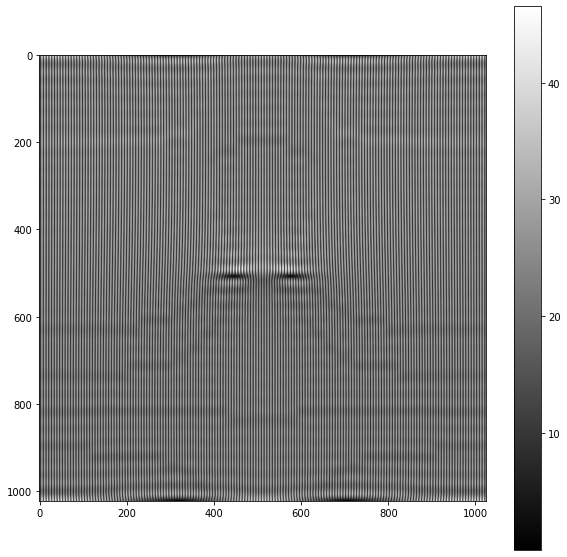

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[2,:],r_mask))))
plt.colorbar()

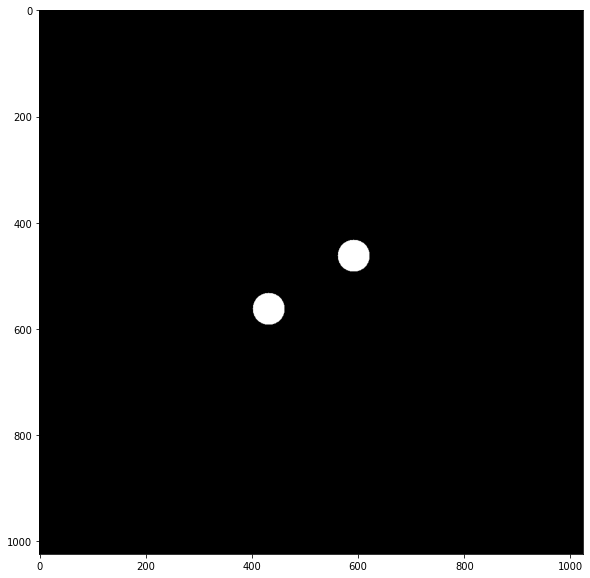

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(FFT_mask(k_vectors[5,:],r_mask))

In [ ]:
IFFT_1=abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[0,:],r_mask=20)))
IFFT_2=abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[2,:],r_mask=20)))
IFFT_3=abs(scipy.fft.ifft2(FFT_shift*FFT_mask(k_vectors[4,:],r_mask=20)))

(-0.5, 1023.5, 1023.5, -0.5)

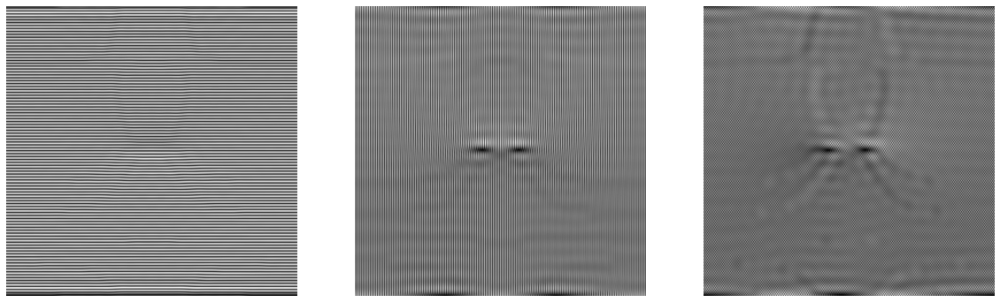

In [ ]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(20,20))
# fig.suptitle('Inverse FFT of three k_vectors')
ax1.imshow(IFFT_1)
ax1.axis('off')
ax2.imshow(IFFT_2)
ax2.axis('off')
ax3.imshow(IFFT_3)
ax3.axis('off')

Rotate the three IFFT images by the angles between the k_vector and the horizontal direction. In the meantime, rotate the atomXY and get the corresponding coordinates in the new images.

These alpha are the angle between the normal vectors to the planes and the vertical direction

In [ ]:
cos_alpha_list=np.zeros((k_vectors.shape[0]))
sin_alpha_list=np.zeros((k_vectors.shape[0]))

for i in range(k_vectors.shape[0]):
  cos_alpha_list[i]=k_vectors[i,0]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
  sin_alpha_list[i]=k_vectors[i,1]/math.sqrt(k_vectors[i,0]**2+k_vectors[i,1]**2)
print(cos_alpha_list)
print(sin_alpha_list)

[ 1.         -1.          0.          0.          0.52999894  0.52999894]
[ 0.         0.         1.        -1.         0.8479983 -0.8479983]


In [ ]:
alpha_list=np.zeros((3))
for i in range(3):
  alpha_list[i]=math.atan(sin_alpha_list[2*i]/cos_alpha_list[2*i])*180/math.pi
print(alpha_list)

[ 0.         90.         57.99461679]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
rot_angles=-alpha_list
print(rot_angles)

[ -0.         -90.         -57.99461679]


In [ ]:
from scipy.ndimage import rotate

def rot(image, xy, angle):
    im_rot = rotate(image,angle)
    xy_new=xy.copy()
    org_center = (np.array(image.shape[:2][::-1]))/2
    rot_center = (np.array(im_rot.shape[:2][::-1]))/2
    for i,x_y in enumerate(xy):
      org=x_y-org_center
      a = -np.deg2rad(angle) # a minus sign works because the "row=x, col=y" convention is adopted here
      new = np.array([org[0]*np.cos(a) + org[1]*np.sin(a),
            -org[0]*np.sin(a) + org[1]*np.cos(a)])
      xy_new[i,:]=new+rot_center
    
    return im_rot, xy_new



In [ ]:
np.array(ZrO2.shape[:2][::-1])

array([1024, 1024])

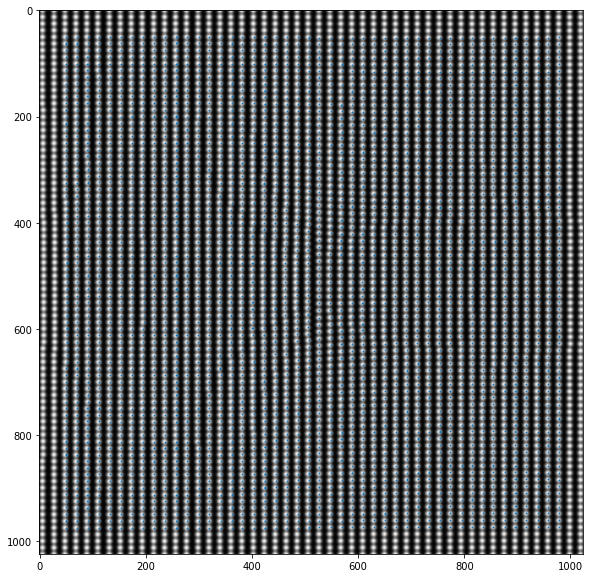

In [ ]:
data_rot, xy_new= rot(ZrO2, atomXY, rot_angles[1])
plt.figure(figsize=(10,10))
plt.imshow(data_rot)
plt.scatter(xy_new[:,1],xy_new[:,0],s=1)


In [ ]:
xy_new.shape

(3868, 2)

In [ ]:
atomXY.shape

(3868, 2)

In [ ]:
IFFT1_rot, atomXY_rot1= rot(IFFT_1, atomXY, rot_angles[0])
IFFT2_rot, atomXY_rot2= rot(IFFT_2, atomXY, rot_angles[1])
IFFT3_rot, atomXY_rot3= rot(IFFT_3, atomXY, rot_angles[2])
print(IFFT1_rot.shape,IFFT2_rot.shape,IFFT3_rot.shape)
print(atomXY_rot1.shape,atomXY_rot2.shape,atomXY_rot3.shape)

(1024, 1024) (1024, 1024) (1411, 1411)
(3868, 2) (3868, 2) (3868, 2)


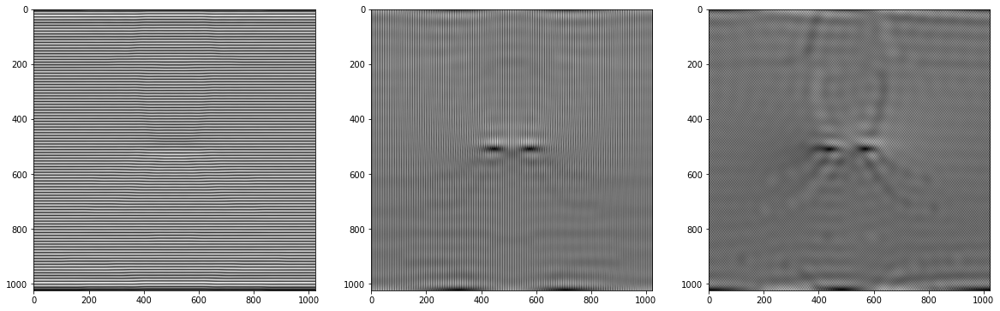

In [ ]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(20,20))
# fig.suptitle('Inverse FFT of three k_vectors')
ax1.imshow(IFFT_1)
ax2.imshow(IFFT_2)
ax3.imshow(IFFT_3)

(-0.5, 1023.5, 1023.5, -0.5)

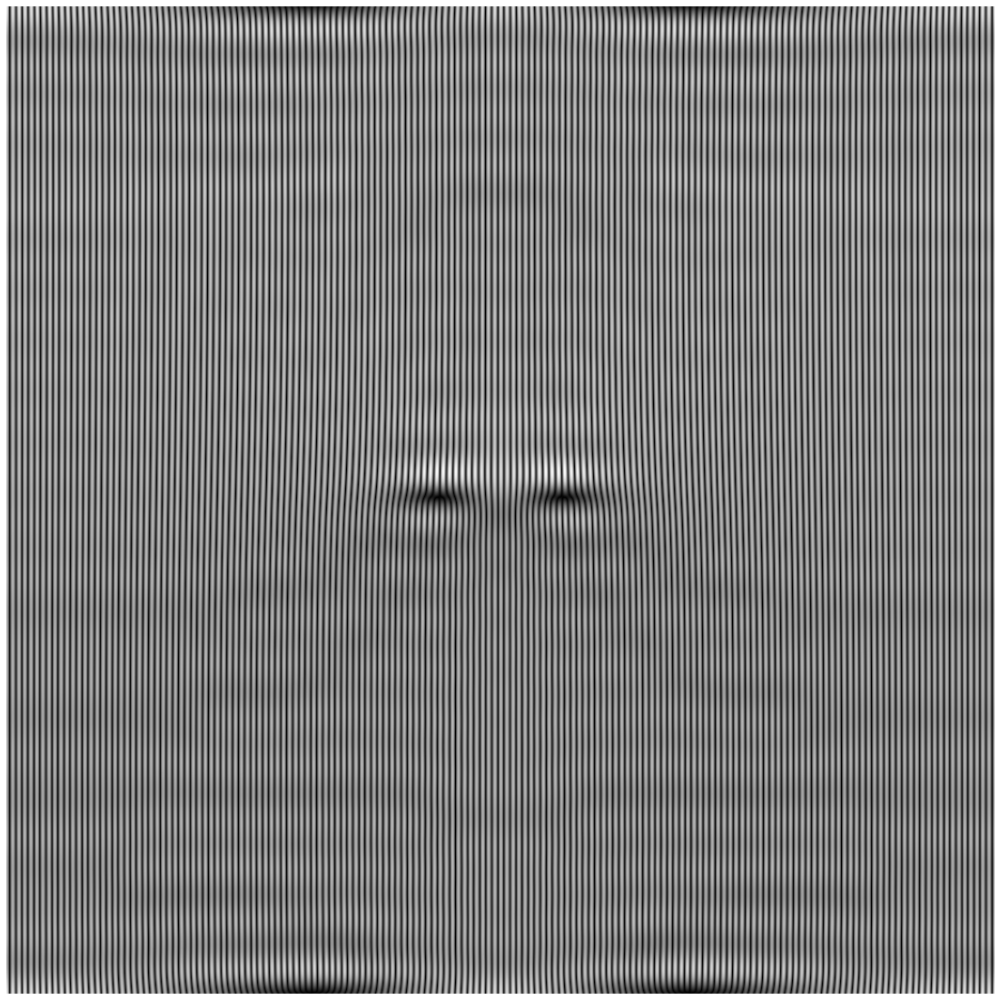

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(IFFT_2)
plt.axis('off')

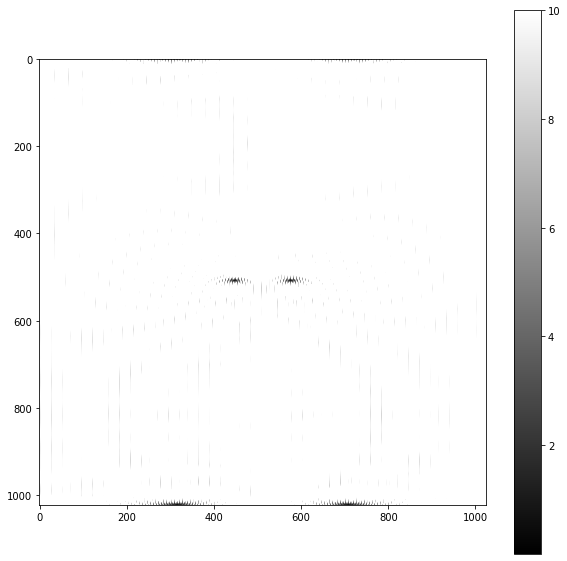

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(IFFT_2,vmax=10)
plt.colorbar()

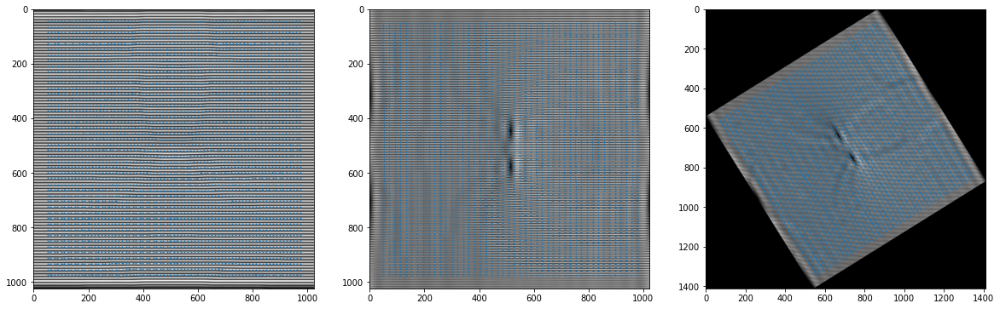

In [ ]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(20,20))
# fig.suptitle('Inverse FFT of three k_vectors')
ax1.imshow(IFFT1_rot)
ax1.scatter(atomXY_rot1[:,1],atomXY_rot1[:,0],s=1)
ax2.imshow(IFFT2_rot)
ax2.scatter(atomXY_rot2[:,1],atomXY_rot2[:,0],s=1)
ax3.imshow(IFFT3_rot)
ax3.scatter(atomXY_rot3[:,1],atomXY_rot3[:,0],s=1)

In [ ]:
d_spacings=np.zeros((3))
for i in range(3):
  d_spacings[i]=round(ZrO2.shape[0]/math.sqrt(k_vectors[2*i,0]**2+k_vectors[2*i,1]**2))
print(d_spacings)

[20. 13. 11.]


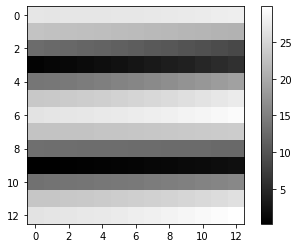

In [ ]:
plt.imshow(IFFT2_rot[500:int(500+d_spacings[1]),500:int(500+d_spacings[1])])
plt.colorbar()

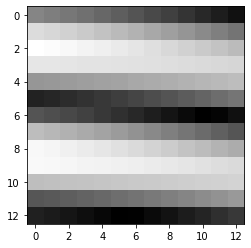

In [ ]:
plt.imshow(IFFT2_rot[420:int(420+d_spacings[1]),1010:int(1010+d_spacings[1])])

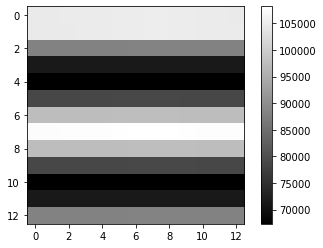

In [ ]:
FFT_T1=scipy.fft.fft2(IFFT2_rot[400:int(400+d_spacings[1]),1000:int(1000+d_spacings[1])])
patterson1=scipy.fft.ifft2(abs(FFT_T1)**2)
patt1=scipy.fft.ifftshift(patterson1)

plt.imshow(abs(patt1))
plt.colorbar()

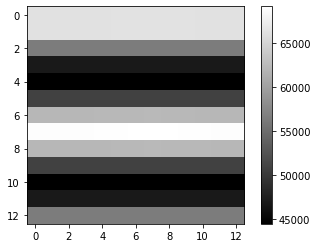

In [ ]:
FFT_T2=scipy.fft.fft2(IFFT2_rot[500:int(500+d_spacings[1]),500:int(500+d_spacings[1])])
patterson2=scipy.fft.ifft2(abs(FFT_T2)**2)
patt2=scipy.fft.ifftshift(patterson2)

plt.imshow(abs(patt2))
plt.colorbar()

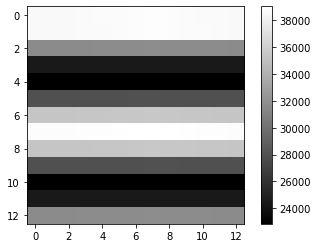

In [ ]:
plt.imshow(abs(patt1-patt2))
plt.colorbar()

## 4. At each atom position, crop the IFFT images IFFT1, IFFT2 and IFFT3 with three squared boxes with d1, d2, and d3
## 5. Take the Patterson function of each cropped image and form P1, P2 and P3

In [ ]:
IFFT2_rot.shape

(1024, 1024)

In [ ]:
def Patterson(im):
   FFT=scipy.fft.fft2(im)
   patterson=scipy.fft.ifft2(abs(FFT)**2)
   patt=scipy.fft.ifftshift(patterson)
   return abs(patt)

In [ ]:
def prep_stack(atomXY_rot1,IFFT1_rot,d_spacing):
   d_spacing=round(d_spacing)
   im_stack_IFFT1=np.zeros((int(atomXY_rot1.shape[0]),int(d_spacing),int(d_spacing)))
   for i, (x,y) in enumerate(atomXY_rot1):
     d_half=d_spacing/2
     im_temp=IFFT1_rot[int(x-d_half):int(x+d_half),int(y-d_half):int(y+d_half)]
     im_stack_IFFT1[i,:,:]=Patterson(im_temp) 
   return im_stack_IFFT1

In [ ]:
d_spacings[1]

13.0

In [ ]:
im_stack_IFFT1=prep_stack(atomXY_rot1,IFFT1_rot,d_spacings[0])
im_stack_IFFT2=prep_stack(atomXY_rot2,IFFT2_rot,d_spacings[1])
im_stack_IFFT3=prep_stack(atomXY_rot3,IFFT3_rot,d_spacings[2])

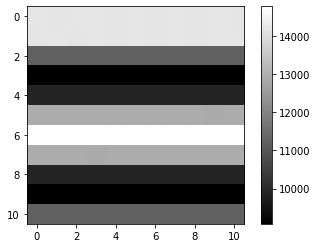

In [ ]:
plt.imshow(im_stack_IFFT3[400,:,:])
plt.colorbar()

[891 449]


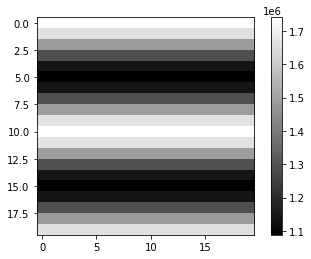

In [ ]:
plt.imshow(im_stack_IFFT1[400,:,:])
plt.colorbar()
print(atomXY_rot1[400])

[449 133]


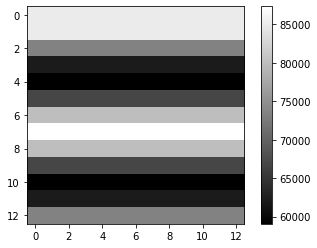

In [ ]:
plt.imshow(im_stack_IFFT2[400,:,:])
plt.colorbar()
print(atomXY_rot2[400])

In [ ]:
def prep_stack_flat(im_stack_IFFT1):

  img_stack=im_stack_IFFT1
  img_stack_flat=img_stack.reshape(img_stack.shape[0],img_stack.shape[1]*img_stack.shape[2])
  print(img_stack_flat.shape)
  return img_stack_flat

In [ ]:
img_stack_flat_1=prep_stack_flat(im_stack_IFFT1)
img_stack_flat_2=prep_stack_flat(im_stack_IFFT2)
img_stack_flat_3=prep_stack_flat(im_stack_IFFT3)

(3868, 400)
(3868, 169)
(3868, 121)


Try the classification using GMM

In [ ]:
from sklearn.mixture import GaussianMixture
def GMM(data_flat):
    # row,col,num=data_stack.shape
    # z3=data_stack.transpose(2,0,1).reshape(num,-1)
    z3=data_flat
    n_components=2
    gmmp = GaussianMixture(n_components=n_components,covariance_type='full',
                           random_state=1090) #diag,'full', ‘tied’, ‘diag’, ‘spherical’
    gmm_zp = gmmp.fit_predict(z3) # predicting the labels for each vector
    clf=gmmp.fit(z3)

    # fig, ax = plt.subplots(1, n_components, figsize=(10,15))
    # for i in np.arange(n_components):
    #    means_i=clf.means_[i,:].reshape(row,col)
    #    ax[i].imshow(means_i,cmap='gray')
    #    ax[i].set_title(round(np.sum(np.sum(means_i)),2))
    #    plt.tight_layout()
    return gmm_zp

In [ ]:
def PCA_reduction(img_stack_flat):

   from sklearn.decomposition import PCA
   pca=PCA()
   pca.fit(img_stack_flat[:,:])              
# pca.fit(img_stack_init_flat[:,:])
   explained_var = pca.explained_variance_ratio_
   sum=0
   nc=0
   i=0
   while sum<0.99:
       print(str(i+1)+'th component accounts for:'+str(explained_var[i]))
       sum=sum+explained_var[i]
       nc=nc+1
       i=i+1
   print(str(nc)+'components can explain'+str(sum)+'of the behavior')

   NC=nc
   pca = PCA(n_components=NC)
   X_vec_t = pca.fit_transform(img_stack_flat[:,:])
   components = pca.components_

   print('shape of the components is')
   print(components.shape)
   print(X_vec_t.shape)
   return X_vec_t

In [ ]:
X_vec_t_2=PCA_reduction(img_stack_flat_2)

1th component accounts for:0.9948266501096497
1components can explain0.9948266501096497of the behavior
shape of the components is
(1, 169)
(3868, 1)


In [ ]:
gmm_zp=GMM(X_vec_t_2)

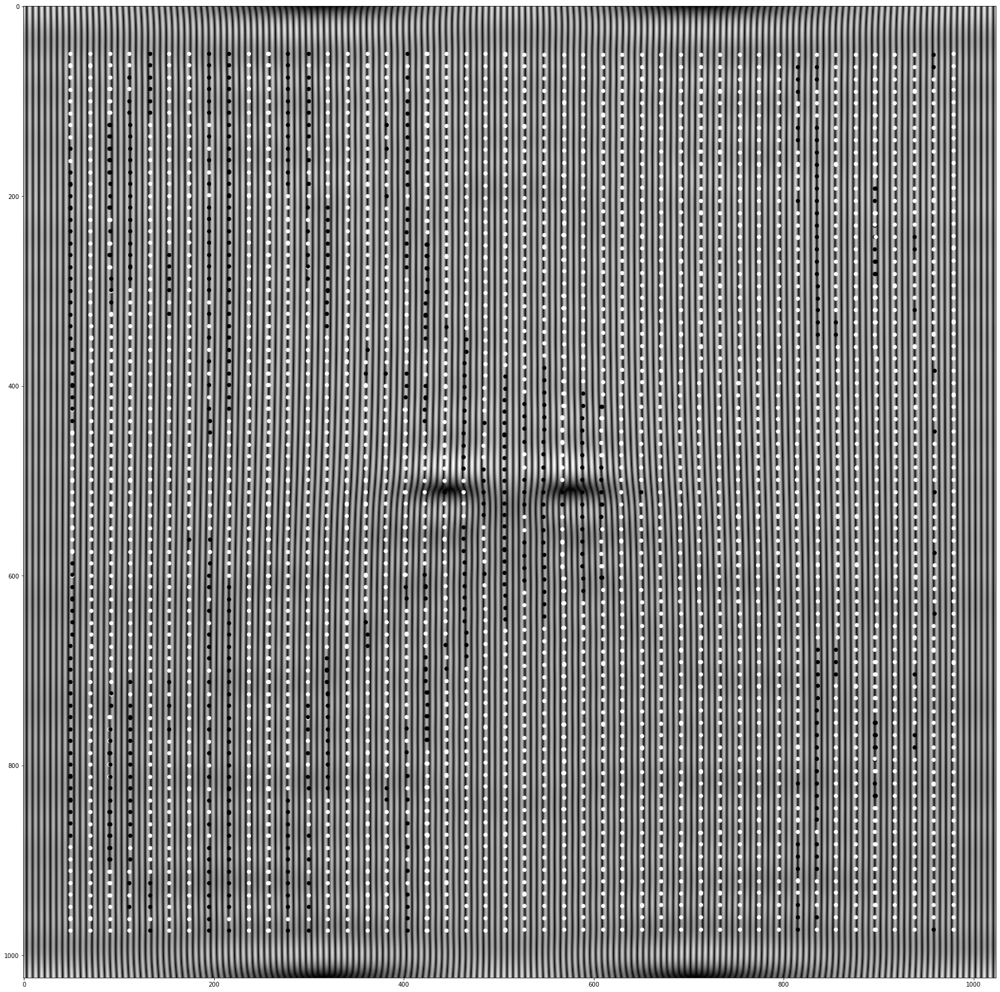

In [ ]:
plt.figure(figsize=(30,30))
plt.imshow(IFFT_2)
# plt.imshow(im,cmap='gray')
plt.scatter(xy_new[:,1],xy_new[:,0],c=gmm_zp[:])


In [ ]:
X_vec_t_2.shape

(3868, 1)

In [ ]:
xy_new.shape

(3868, 2)

In [ ]:
%matplotlib 

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d  

Using matplotlib backend: agg


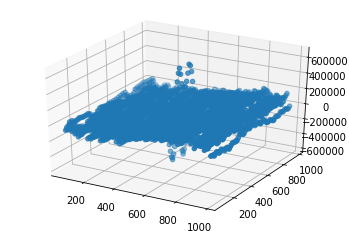

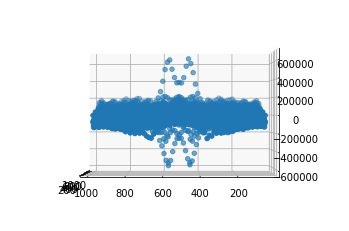

In [ ]:
%matplotlib inline
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(xy_new[:,1],xy_new[:,0],X_vec_t_2[:,0])
plt.show()
ax.view_init(0, 180)
fig

(array([  2.,   0.,   2.,   0.,   3.,   0.,   1.,   0.,   0.,   0.,   0.,
          2.,   0.,   1.,   1.,   0.,   0.,   0.,   1.,   1.,   1.,   1.,
          1.,   2.,   1.,   5.,   3.,   2.,   4.,   3.,   8.,  14.,  14.,
          6.,  20.,  61.,  72., 116., 149., 132., 126., 152., 151., 205.,
        185., 206., 228., 180., 177., 209., 239., 218., 213., 197., 137.,
        100.,  88.,  63.,  45.,  35.,  31.,  17.,   6.,   8.,   6.,   0.,
          0.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,
          3.,   0.,   1.,   0.,   0.,   2.,   0.,   0.,   0.,   0.,   1.,
          0.,   0.,   2.,   0.,   0.,   1.,   0.,   1.,   1.,   0.,   1.,
          1.]), array([-568431.91420414, -556367.4585454 , -544303.00288665,
        -532238.54722791, -520174.09156917, -508109.63591042,
        -496045.18025168, -483980.72459294, -471916.26893419,
        -459851.81327545, -447787.3576167 , -435722.90195796,
        -423658.44629922, -411593.99064047, -399529.53498173,
        -

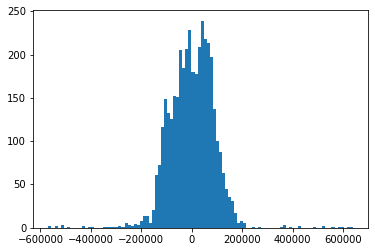

In [ ]:
plt.hist(X_vec_t_2,bins=100)

In [ ]:
xy_new[np.where(X_vec_t_2>=40000)]

array([862, 650, 625, ..., 525, 511, 448])

In [ ]:
plt.scatter(xy_out[:,1],xy_out[:,0])

NameError: ignored

# 6. Do the classification using SVM 

In [ ]:
# from sklearn.manifold import TSNE
# X = img_stack_flat_2
# X_embedded = TSNE(n_components=3).fit_transform(X)
# X_embedded.shape

In [ ]:
# plt.scatter(X_embedded[:,0],X_embedded[:,1])

In [ ]:
def PCA_reduction(img_stack_flat):

   from sklearn.decomposition import PCA
   pca=PCA()
   pca.fit(img_stack_flat[:,:])              
# pca.fit(img_stack_init_flat[:,:])
   explained_var = pca.explained_variance_ratio_
   sum=0
   nc=0
   i=0
   while sum<0.95:
       print(str(i+1)+'th component accounts for:'+str(explained_var[i]))
       sum=sum+explained_var[i]
       nc=nc+1
       i=i+1
   print(str(nc)+'components can explain'+str(sum)+'of the behavior')

   NC=nc
   pca = PCA(n_components=NC)
   X_vec_t = pca.fit_transform(img_stack_flat[:,:])
   components = pca.components_

   print('shape of the components is')
   print(components.shape)
   print(X_vec_t.shape)
   return X_vec_t

In [ ]:
X_vec_t_1=PCA_reduction(img_stack_flat_1)
X_vec_t_2=PCA_reduction(img_stack_flat_2)
X_vec_t_3=PCA_reduction(img_stack_flat_3)

1th component accounts for:0.991570938970474
1components can explain0.991570938970474of the behavior
shape of the components is
(1, 400)
(3868, 1)
1th component accounts for:0.9948266501096497
1components can explain0.9948266501096497of the behavior
shape of the components is
(1, 169)
(3868, 1)
1th component accounts for:0.9977895115489048
1components can explain0.9977895115489048of the behavior
shape of the components is
(1, 121)
(3868, 1)


In [ ]:
np.array((1,2)).max()

2

In [ ]:
X_vec_t_2_norm=X_vec_t_2.copy()
X_vec_t_2_norm[:,0]=X_vec_t_2[:,0]/np.array((abs(X_vec_t_2[:,0].max()),abs(X_vec_t_2[:,0].min()))).max()
# X_vec_t_2_norm[:,1]=X_vec_t_2[:,1]/np.array((abs(X_vec_t_2[:,1].max()),abs(X_vec_t_2[:,1].min()))).max()
# X_vec_t_2_norm[:,2]=X_vec_t_2[:,2]/np.array((abs(X_vec_t_2[:,2].max()),abs(X_vec_t_2[:,2].min()))).max()

In [ ]:
# plt.scatter(X_vec_t_2_norm[:,0],X_vec_t_2_norm[:,1])

IndexError: ignored

In [ ]:
def OCSVM2(X_vec_t,nu):
   
   from sklearn.svm import OneClassSVM
   clf=OneClassSVM(kernel='rbf',gamma='scale',nu=nu).fit(X_vec_t)
   cate=clf.predict(X_vec_t)
   scores=clf.score_samples(X_vec_t)
   decision_f=clf.decision_function(X_vec_t)
   plt.hist(decision_f,bins=100)
   plt.xlabel('The decision function')
   plt.ylabel('# of data points')
   return decision_f,cate

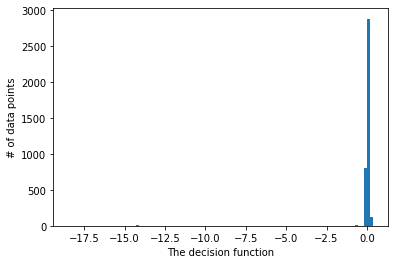

In [ ]:
decision_f_2,cate=OCSVM2(X_vec_t_2,0.03)

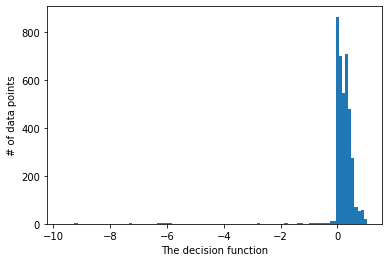

In [ ]:
decision_f_2,cate=OCSVM2(X_vec_t_2_norm,0.03)

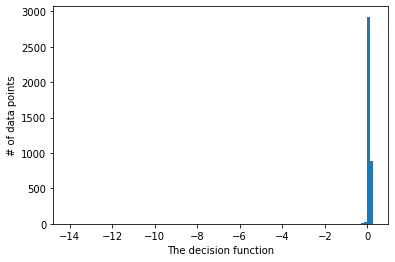

In [ ]:
decision_f_2,cate=OCSVM2(img_stack_flat_2,0.02)

In [ ]:
color_outlier=np.zeros((img_stack_flat_2.shape[0]))
for i in range(color_outlier.shape[0]):
  if decision_f_2[i]>=-1:
    color_outlier[i]=1
  if decision_f_2[i]<-1:
    color_outlier[i]=-1

In [ ]:
color_outlier=np.zeros((img_stack_flat_2.shape[0]))
for i in range(color_outlier.shape[0]):
  if cate[i]==1:
    color_outlier[i]=1
  if cate[i]==-1:
    color_outlier[i]=-1

IndexError: ignored

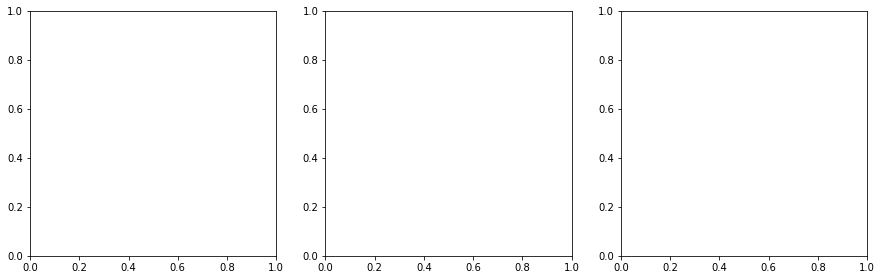

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,4.5))
plt.set_cmap('rainbow')


ax[0].scatter(X_vec_t_2[:,0],X_vec_t_2[:,1],c=color_outlier)
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')

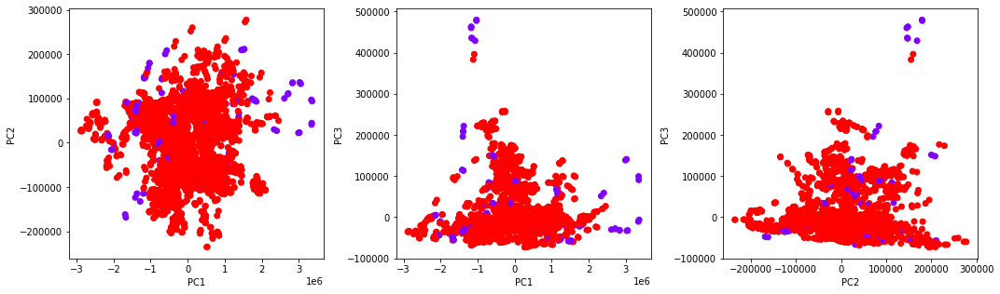

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,4.5))
plt.set_cmap('rainbow')


ax[0].scatter(X_vec_t_1[:,0],X_vec_t_1[:,1],c=color_outlier)
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')

ax[1].scatter(X_vec_t_1[:,0],X_vec_t_1[:,2],c=color_outlier)
ax[1].set_xlabel('PC1')
ax[1].set_ylabel('PC3')

ax[2].scatter(X_vec_t_1[:,1],X_vec_t_1[:,2],c=color_outlier)
ax[2].set_xlabel('PC2')
ax[2].set_ylabel('PC3')

plt.tight_layout(h_pad=2)

IndexError: ignored

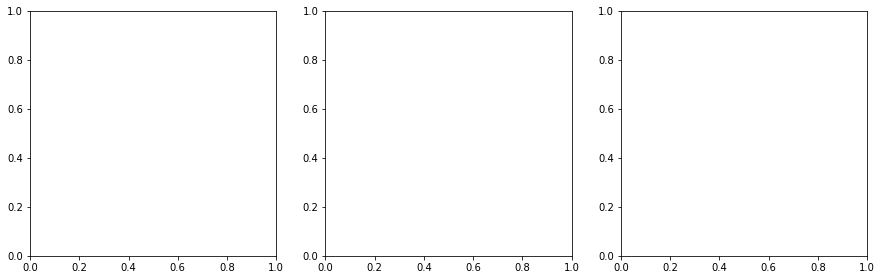

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15,4.5))
plt.set_cmap('rainbow')


ax[0].scatter(X_vec_t_2[:,0],X_vec_t_2[:,1],c=color_outlier)
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')

ax[1].scatter(X_vec_t_2[:,0],X_vec_t_2[:,2],c=color_outlier)
ax[1].set_xlabel('PC1')
ax[1].set_ylabel('PC3')

ax[2].scatter(X_vec_t_2[:,1],X_vec_t_2[:,2],c=color_outlier)
ax[2].set_xlabel('PC2')
ax[2].set_ylabel('PC3')

plt.tight_layout(h_pad=2)

(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 432x288 with 0 Axes>

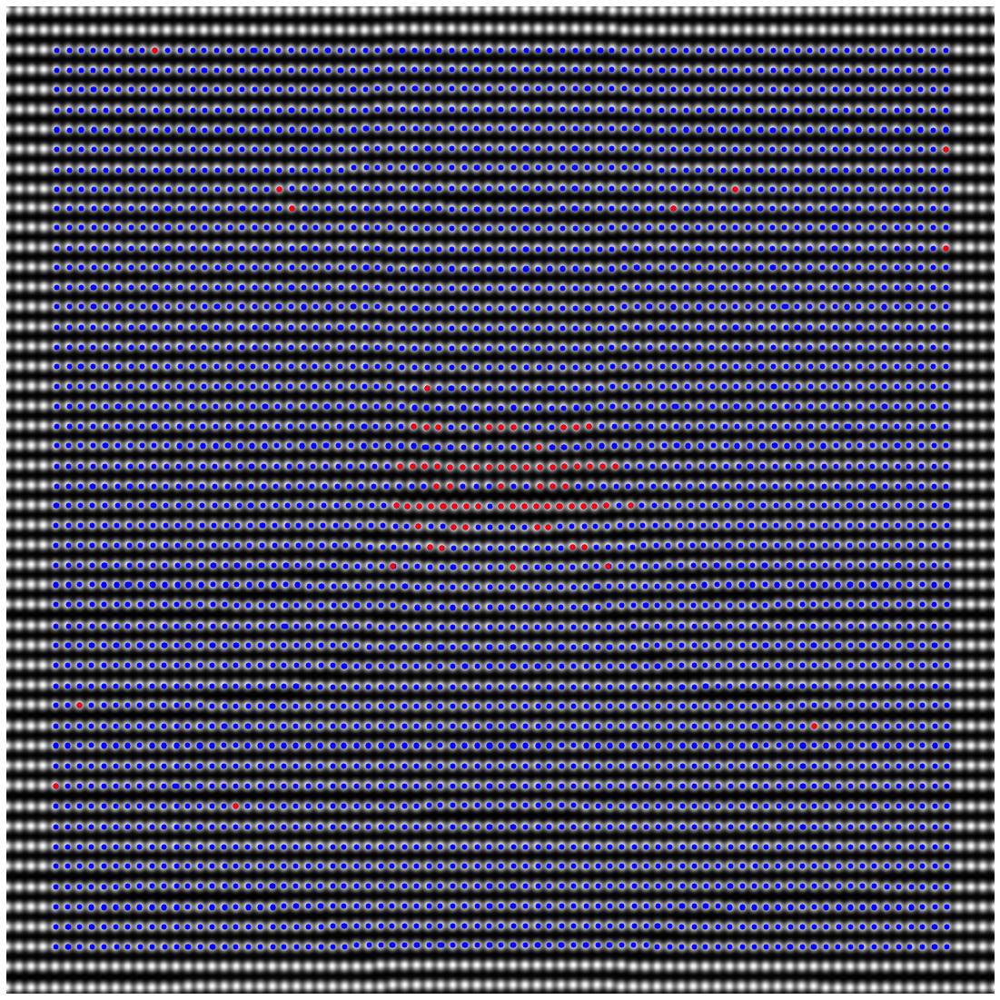

In [ ]:
outlier_coord=atomXY[np.where(color_outlier==-1)]
plt.set_cmap('gray')
plt.figure(figsize=(20,20))
plt.imshow(ZrO2)
# plt.imshow(IFFT_2)
# plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=15,c='b')
plt.scatter(atomXY[:,1],atomXY[:,0],s=25,c='b')
plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=25,c='r')
plt.axis('off')

(-0.5, 1023.5, 1023.5, -0.5)

<Figure size 432x288 with 0 Axes>

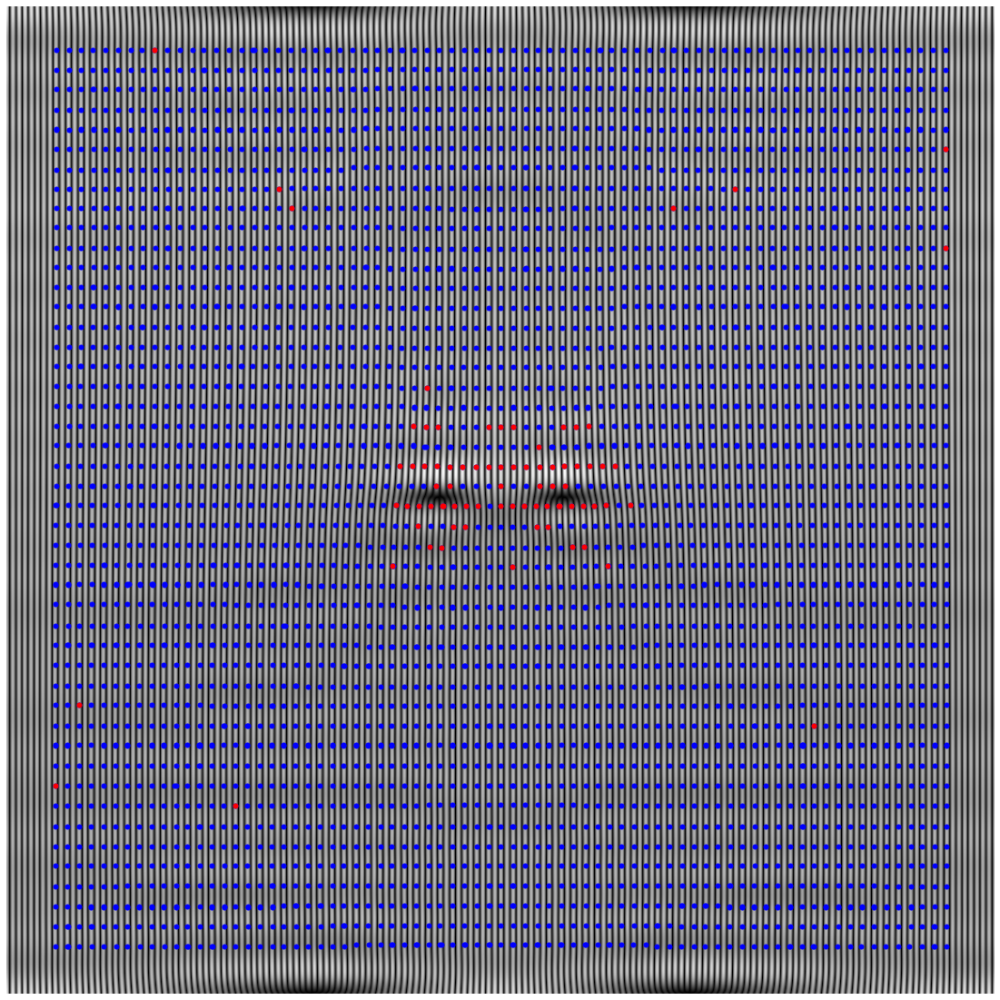

In [ ]:
outlier_coord=atomXY[np.where(color_outlier==-1)]
plt.set_cmap('gray')
plt.figure(figsize=(20,20))
# plt.imshow(ZrO2)
plt.imshow(IFFT_2)
# plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=15,c='b')
plt.scatter(atomXY[:,1],atomXY[:,0],s=25,c='b')
plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=25,c='r')
plt.axis('off')

In [ ]:
outlier_coord=atomXY[np.where(color_outlier==-1)]
plt.set_cmap('gray')
plt.figure(figsize=(20,20))
plt.imshow(IFFT2)
plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=95,c='b')
plt.scatter(atomXY[:,1],atomXY[:,0],s=15,c='r')
plt.axis('off')

NameError: ignored

<Figure size 432x288 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [ ]:
# np.c_[xx1.ravel(),yy1.ravel()]

It may be neccessary to normalize each coefficent of the PC components to 
emphase the variation parallel to the fringes



In [ ]:
'''
print(__doc__)

# Author: Virgile Fritsch <virgile.fritsch@inria.fr>
# License: BSD 3 clause

import numpy as np
from sklearn.covariance import EllipticEnvelope
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt
import matplotlib.font_manager
from sklearn.datasets import load_wine

# Define "classifiers" to be used
classifiers = {
    "Empirical Covariance": EllipticEnvelope(support_fraction=1.,
                                             contamination=0.25),
    "Robust Covariance (Minimum Covariance Determinant)":
    EllipticEnvelope(contamination=0.25),
    "OCSVM": OneClassSVM(nu=0.25, gamma=0.35)}
colors = ['m', 'g', 'b']
legend1 = {}
legend2 = {}

# Get data
# X1 = load_wine()['data'][:, [1, 2]]  # two clusters
X1=X_vec_t_2[:,1:2]
# Learn a frontier for outlier detection with several classifiers
xx1, yy1 = np.meshgrid(np.linspace(X_vec_t_2[:,0].min(), X_vec_t_2[:,0].max(),500), np.linspace(X_vec_t_2[:,1].min(), X_vec_t_2[:,1].max(),500))
for i, (clf_name, clf) in enumerate(classifiers.items()):
    plt.figure(1)
    clf.fit(X1)
    Z1 = clf.decision_function(np.c_[xx1.ravel(), yy1.ravel()])
    Z1 = Z1.reshape(xx1.shape)
    legend1[clf_name] = plt.contour(
        xx1, yy1, Z1, levels=[0], linewidths=2, colors=colors[i])

legend1_values_list = list(legend1.values())
legend1_keys_list = list(legend1.keys())

# Plot the results (= shape of the data points cloud)
plt.figure(1)  # two clusters
plt.title("Outlier detection on a real data set (wine recognition)")
plt.scatter(X1[:, 0], X1[:, 1], color='black')
bbox_args = dict(boxstyle="round", fc="0.8")
arrow_args = dict(arrowstyle="->")
plt.annotate("outlying points", xy=(4, 2),
             xycoords="data", textcoords="data",
             xytext=(3, 1.25), bbox=bbox_args, arrowprops=arrow_args)
plt.xlim((xx1.min(), xx1.max()))
plt.ylim((yy1.min(), yy1.max()))
plt.legend((legend1_values_list[0].collections[0],
            legend1_values_list[1].collections[0],
            legend1_values_list[2].collections[0]),
           (legend1_keys_list[0], legend1_keys_list[1], legend1_keys_list[2]),
           loc="upper center",
           prop=matplotlib.font_manager.FontProperties(size=11))
plt.ylabel("ash")
plt.xlabel("malic_acid")

plt.show()
'''

In [ ]:
plt.scatter(X_vec_t_2[:,2]/X_vec_t_2[:,2].max(),X_vec_t_2[:,1]/X_vec_t_2[:,1].max())

In [ ]:
plt.hist(X_vec_t_3,bins=100)

In [ ]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 32}

matplotlib.rc('font', **font)

In [ ]:
def OCSVM(X_vec_t,nu):
   
   from sklearn.svm import OneClassSVM
   clf=OneClassSVM(gamma='scale',nu=nu).fit(X_vec_t)
   cate=clf.predict(X_vec_t)
   scores=clf.score_samples(X_vec_t)
   decision_f=clf.decision_function(X_vec_t)
   plt.hist(decision_f,bins=100)
   plt.xlabel('The decision function')
   plt.ylabel('# of data points')
   return decision_f

In [ ]:
from sklearn.svm import OneClassSVM

In [ ]:
X_vec_t_2.var()

In [ ]:
X_vec_t=X_vec_t_2
nu_min=0.01
nu_max=0.99
nu_step=0.01
#the number of nu i the horizontal direction
nu_num=(nu_max-nu_min)/nu_step
nu_num=int(nu_num)
gamma_0=1/(X_vec_t.shape[1]*X_vec_t[:,:].var())
# gamma_ratios=np.arange(0.5,3,0.5)
gamma_ratios=np.arange(1,10,1)
#the number of gamma
gamma_num=len(gamma_ratios)

Dvs=np.zeros((gamma_num,nu_num))

for j,gamma_ratio in enumerate(gamma_ratios):
   for i, nu in enumerate(np.arange(nu_min,nu_max,nu_step)):
      clf=OneClassSVM(gamma=gamma_ratio*gamma_0,nu=nu,max_iter=-1).fit(X_vec_t)
      decision_f=clf.decision_function(X_vec_t)
      P1=np.median(decision_f[np.where(decision_f<=0)])
      P2=np.median(decision_f[np.where(decision_f>0)])
      Dv=(P2-P1)/(decision_f.max()-decision_f.min())
      Dvs[j,i]=Dv
    

plt.plot(np.arange(nu_min,nu_max,nu_step),Dvs[0,:])
plt.xlabel('The nu parameter')
plt.ylabel('D(v)')

In [ ]:
nu_min=0.01
nu_max=0.99
nu_step=0.005

In [ ]:
ratio_rank=8
plt.plot(np.arange(nu_min,nu_max,nu_step),Dvs[ratio_rank,:])
plt.xlabel(r'$\nu$')
plt.ylabel('D('r'$\nu$'')')
plt.xlim(0.0,0.1)
plt.minorticks_on()
# plt.ylim(0,0.5)
print(gamma_ratios[ratio_rank])

In [ ]:
gamma_0

In [ ]:
gamma=gamma_ratio*gamma_0

In [ ]:
# from sklearn.neighbors import KNeighborsClassifier
# neigh = KNeighborsClassifier(n_neighbors=3)

In [ ]:
clf=OneClassSVM(gamma=5*gamma_0,nu=0.04,max_iter=-1).fit(X_vec_t_2)
decision_f_2=clf.decision_function(X_vec_t_2)
plt.hist(decision_f_2,bins=1000)
# plt.xlim(-0,1)
# plt.ylim(0,100)

In [ ]:
decision_f_1=OCSVM(X_vec_t_1,0.52)
plt.xlim(-1000,100)
# decision_f_1=OCSVM(img_stack_flat_1,0.45)

In [ ]:
lower_limit=-260

In [ ]:
decision_f_2=OCSVM(X_vec_t_2[:,1:2],0.10)
plt.ylim(0,100)
# decision_f_2=OCSVM(img_stack_flat_2,0.05)
lower_limit_2=0

In [ ]:
decision_f_3=OCSVM(X_vec_t_3[:,1:],0.85)

In [ ]:
plt.hist(cate)

In [ ]:

def N_of_outliers(X_vec_t,nu_min,nu_max,nu_step,IQR_ratio=1.5):
   
   Number_of_outliers=[]
   for i, nu in enumerate(np.arange(nu_min,nu_max,nu_step)):
     clf=OneClassSVM(gamma='scale',nu=nu,max_iter=-1).fit(X_vec_t)
     decision_f=clf.decision_function(X_vec_t)
     Q1=np.median(decision_f[np.where(decision_f<np.median(decision_f))])
     Q3=np.median(decision_f[np.where(decision_f>np.median(decision_f))])
     lower_limit=Q1-(Q3-Q1)*IQR_ratio
     num_outliers=decision_f[np.where(decision_f<lower_limit)].shape[0]
     Number_of_outliers.append(num_outliers)
   Number_of_outliers=np.array(Number_of_outliers)
   
   return Number_of_outliers

Consider the outlier in the upper bound

In [ ]:
def N_of_outliers2(X_vec_t,nu_min,nu_max,nu_step,IQR_ratio=1.5):
   
   Number_of_outliers2=[]
   for i, nu in enumerate(np.arange(nu_min,nu_max,nu_step)):
     clf=OneClassSVM(gamma='scale',nu=nu,max_iter=-1).fit(X_vec_t)
     decision_f=clf.decision_function(X_vec_t)
     Q1=np.median(decision_f[np.where(decision_f<np.median(decision_f))])
     Q3=np.median(decision_f[np.where(decision_f>np.median(decision_f))])
     upper_limit=Q3+(Q3-Q1)*IQR_ratio
     num_outliers=decision_f[np.where(decision_f>upper_limit)].shape[0]
     Number_of_outliers2.append(num_outliers)
   Number_of_outliers2=np.array(Number_of_outliers2)
   
   return Number_of_outliers2

In [ ]:
# nu_min=0.7
# nu_max=0.99
# nu_step=0.01
# Number_of_outliers_2=N_of_outliers(X_vec_t_2,nu_min,nu_max,nu_step,IQR_ratio=1.5)
# plt.plot(np.arange(nu_min,nu_max,nu_step),Number_of_outliers_2)
# plt.xlabel('The nu parameter')
# plt.ylabel('# of outliers')

In [ ]:
# nu_min=0.6
# nu_max=0.99
# nu_step=0.01
# Number_of_outliers_3=N_of_outliers(X_vec_t_3,nu_min,nu_max,nu_step)
# plt.plot(np.arange(nu_min,nu_max,nu_step),Number_of_outliers_3)
# plt.xlabel('The nu parameter')
# plt.ylabel('# of outliers')

In [ ]:
# plt.hist(scores,density=True,bins=100)

In [ ]:
# lower_limit=scores.mean()-3*scores.std()
lower_limit=0.5
print(lower_limit)

In [ ]:
# color_outlier=np.zeros((img_stack_flat.shape[0]))
# for i in range(color_outlier.shape[0]):
#   if scores[i]>=lower_limit:
#     color_outlier[i]=1
#   if scores[i]<lower_limit:
#     color_outlier[i]=-1


In [ ]:
color_outlier=np.zeros((img_stack_flat_1.shape[0]))
for i in range(color_outlier.shape[0]):
  if cate[i]==1:
    color_outlier[i]=1
  if cate[i]==-1:
    color_outlier[i]=-1

In [ ]:
decision_f=decision_f_2

In [ ]:
lower_limit=0.5

outlier>limit

In [ ]:
color_outlier=np.zeros((img_stack_flat_2.shape[0]))
for i in range(color_outlier.shape[0]):
  if decision_f[i]<lower_limit:
    color_outlier[i]=1
  if decision_f[i]>=lower_limit:
    color_outlier[i]=-1

outlier<limit

In [ ]:
color_outlier=np.zeros((img_stack_flat_2.shape[0]))
for i in range(color_outlier.shape[0]):
  if decision_f[i]>lower_limit:
    color_outlier[i]=1
  if decision_f[i]<=lower_limit:
    color_outlier[i]=-1


Isolation forrest

In [ ]:
from sklearn.ensemble import IsolationForest
clf = IsolationForest(random_state=0)
Y_vec_t_2=clf.fit_predict(img_stack_flat_3)

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
clf = LocalOutlierFactor(n_neighbors=7)
Y_vect_2=clf.fit_predict(X_vec_t_2)

In [ ]:
plt.hist(Y_vec_t_2)

In [ ]:
color_outlier=np.zeros((img_stack_flat_1.shape[0]))
for i in range(color_outlier.shape[0]):
  if Y_vec_t_2[i]==1:
    color_outlier[i]=1
  if Y_vec_t_2[i]==-1:
    color_outlier[i]=-1

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(IFFT_2)

In [ ]:
outlier_coord=atomXY[np.where(color_outlier==-1)]
plt.set_cmap('gray')
plt.figure(figsize=(20,20))
# plt.imshow(ZrO2)
plt.imshow(IFFT_2)
plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=95,c='b')
plt.scatter(atomXY[:,1],atomXY[:,0],s=15,c='r')
plt.axis('off')

It seems to work well!
Maybe a few things may be adjusted:
1. masks for spots in FFT could include circles with subpixel resolution
2. The the sign of the support vectors (semi-supervised or some other tunning or parameters)
3. Classification of two other IFFT (IFFT2 and IFFT3)

Classification for IFFT2

In [ ]:
# lower_limit_2=

In [ ]:
color_outlier=np.zeros((img_stack_flat.shape[0]))
for i in range(color_outlier.shape[0]):
  if decision_f_2[i]>=lower_limit_2:
    color_outlier[i]=1
  if decision_f_2[i]<lower_limit_2:
    color_outlier[i]=-1


In [ ]:
outlier_coord=atomXY[np.where(color_outlier==-1)]
plt.set_cmap('gray')
plt.figure(figsize=(20,20))
plt.imshow(ZrO2)
plt.scatter(outlier_coord[:,1],outlier_coord[:,0],s=95,c='b')
plt.scatter(atomXY[:,1],atomXY[:,0],s=15,c='r')
plt.axis('off')

In [ ]:
img_stack_flat_2N=img_stack_flat_2[np.where(color_outlier==1)]
img_stack_flat_2O=img_stack_flat_2[np.where(color_outlier==-1)]

In [ ]:
X_vector_t_2N=PCA_reduction(img_stack_flat_2N)

In [ ]:
X_vector_t_2O=PCA_reduction(img_stack_flat_2O)

In [ ]:
cate_2N,decision_f2N=OCSVM2(X_vector_t_2N,nu=0.05)

In [ ]:
cate_2O,decision_f2O=OCSVM2(X_vector_t_2O,nu=0.05)

In [ ]:
nu_min=0.01
nu_max=0.99
nu_step=0.01
Number_of_outliers_2N=N_of_outliers(X_vector_t_2N,nu_min,nu_max,nu_step)
plt.plot(np.arange(nu_min,nu_max,nu_step),Number_of_outliers_2N)
plt.xlabel('The nu parameter')
plt.ylabel('# of outliers')

In [ ]:
plt.scatter(X_vector_t_2N[:,0],X_vector_t_2N[:,2])